In [184]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib
import cv2

In [185]:
# !pip install opencv-python

https://www.kaggle.com/datasets/threnjen/board-games-database-from-boardgamegeek

In [186]:
games = pd.read_csv('../datasets/games.csv')

games.csv

	BGGId			BoardGameGeek game ID		
	Name			Name of game
	Description		Description, stripped of punctuation and lemmatized
	YearPublished		First year game published
	GameWeight		Game difficulty/complexity
	AvgRating		Average user rating for game
	BayesAvgRating		Bayes weighted average for game (x # of average reviews applied)
	StdDev			Standard deviation of Bayes Avg
	MinPlayers		Minimum number of players
	MaxPlayers		Maximun number of players
	ComAgeRec		Community's recommended age minimum
	LanguageEase		Language requirement
	BestPlayers		Community voted best player count
	GoodPlayers		List of community voted good plater counts
	NumOwned		Number of users who own this game
	NumWant			Number of users who want this game
	NumWish			Number of users who wishlisted this game
	NumWeightVotes		? Unknown
	MfgPlayTime		Manufacturer Stated Play Time
	ComMinPlaytime		Community minimum play time
	ComMaxPlaytime		Community maximum play time
	MfgAgeRec		Manufacturer Age Recommendation
	NumUserRatings		Number of user ratings
	NumComments		Number of user comments
	NumAlternates		Number of alternate versions
	NumExpansions		Number of expansions
	NumImplementations	Number of implementations
	IsReimplementation	Binary - Is this listing a reimplementation? 
	Family			Game family
	Kickstarted		Binary - Is this a kickstarter?
	ImagePath		Image http:// path
	Rank:boardgame		Rank for boardgames overall
	Rank:strategygames	Rank in strategy games
	Rank:abstracts		Rank in abstracts
	Rank:familygames	Rank in family games
	Rank:thematic		Rank in thematic
	Rank:cgs		Rank in card games
	Rank:wargames		Rank in war games
	Rank:partygames		Rank in party games
	Rank:childrensgames	Rank in children's games
	Cat:Thematic		Binary is in Thematic category
	Cat:Strategy		Binary is in Strategy category
	Cat:War			Binary is in War category
	Cat:Family		Binary is in Family category
	Cat:CGS			Binary is in Card Games category
	Cat:Abstract		Binary is in Abstract category
	Cat:Party		Binary is in Party category
	Cat:Childrens		Binary is in Childrens category

In [187]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_colwidth", 100)

In [188]:
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21925 entries, 0 to 21924
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   BGGId                21925 non-null  int64  
 1   Name                 21925 non-null  object 
 2   Description          21924 non-null  object 
 3   YearPublished        21925 non-null  int64  
 4   GameWeight           21925 non-null  float64
 5   AvgRating            21925 non-null  float64
 6   BayesAvgRating       21925 non-null  float64
 7   StdDev               21925 non-null  float64
 8   MinPlayers           21925 non-null  int64  
 9   MaxPlayers           21925 non-null  int64  
 10  ComAgeRec            16395 non-null  float64
 11  LanguageEase         16034 non-null  float64
 12  BestPlayers          21925 non-null  int64  
 13  GoodPlayers          21925 non-null  object 
 14  NumOwned             21925 non-null  int64  
 15  NumWant              21925 non-null 

In [189]:
games.isna().sum()

BGGId                      0
Name                       0
Description                1
YearPublished              0
GameWeight                 0
AvgRating                  0
BayesAvgRating             0
StdDev                     0
MinPlayers                 0
MaxPlayers                 0
ComAgeRec               5530
LanguageEase            5891
BestPlayers                0
GoodPlayers                0
NumOwned                   0
NumWant                    0
NumWish                    0
NumWeightVotes             0
MfgPlaytime                0
ComMinPlaytime             0
ComMaxPlaytime             0
MfgAgeRec                  0
NumUserRatings             0
NumComments                0
NumAlternates              0
NumExpansions              0
NumImplementations         0
IsReimplementation         0
Family                 15262
Kickstarted                0
ImagePath                 17
Rank:boardgame             0
Rank:strategygames         0
Rank:abstracts             0
Rank:familygam

In [190]:
games.describe().T

,count,mean,std,min,25%,50%,75%,max
BGGId,21925.0,117652.663216,104628.721777,1.000000,12346.000000,105305.00000,206169.00000,349161.00000
YearPublished,21925.0,1985.494914,212.486214,-3500.000000,2001.000000,2011.00000,2017.00000,2021.00000
GameWeight,21925.0,1.982131,0.848983,0.000000,1.333300,1.96880,2.52520,5.00000
AvgRating,21925.0,6.424922,0.932477,1.041330,5.836960,6.45395,7.05245,9.91429
BayesAvgRating,21925.0,5.685673,0.365311,3.574810,5.510300,5.54654,5.67989,8.51488
StdDev,21925.0,1.516374,0.285578,0.196023,1.320720,1.47688,1.66547,4.27728
MinPlayers,21925.0,2.007343,0.693093,0.000000,2.000000,2.00000,2.00000,10.00000
MaxPlayers,21925.0,5.707868,15.014643,0.000000,4.000000,4.00000,6.00000,999.00000
ComAgeRec,16395.0,10.004391,3.269157,2.000000,8.000000,10.00000,12.00000,21.00000
LanguageEase,16034.0,216.461819,236.595136,1.000000,24.027778,138.00000,351.00000,1757.00000


Here YearPublished has -ve values.

The board gaming market experienced significant growth from the late 1990s [[source](https://en.wikipedia.org/wiki/Board_game)].We will filter our board games dated before the Year 1995.

In [191]:
games=games.loc[games['YearPublished']>= 1995]
# games.drop('Description',axis='columns',inplace=True)
games.head()

,BGGId,Name,Description,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,ComAgeRec,LanguageEase,BestPlayers,GoodPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumImplementations,IsReimplementation,Family,Kickstarted,ImagePath,Rank:boardgame,Rank:strategygames,Rank:abstracts,Rank:familygames,Rank:thematic,Rank:cgs,Rank:wargames,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
2,3,Samurai,samurai set medieval japan player compete gain favor faction samurai peasant priest represent he...,1998,2.4859,7.45601,7.23994,1.18227,2,4,9.307692,1.000000,3,"['2', '3', '4']",15578,799,3450,1451,60,30,60,10,15146,0,6,0,1,0,Euro Classics (Reiner Knizia),0,https://cf.geekdo-images.com/o9-sNXmFS_TLAb7ZlZ4dRA__original/img/TPKZgpNxB_C73RNbhKyP6UR76X0=/0...,224,166,21926,21926,21926,21926,21926,21926,21926,0,1,0,0,0,0,0,0
8,9,El Caballero,refer sequel el grande el caballero share aspect namesake fun intense brainburner player explore...,1998,3.1824,6.45265,5.92290,1.43335,2,4,11.777778,1.111111,3,"['2', '3', '4']",2611,87,311,148,90,90,90,13,1389,0,1,0,0,0,El Grand,0,https://cf.geekdo-images.com/lWotCtplnl0sI3bS_jF3-Q__original/img/lpPExjqfY9fpRvaqnlhVkhKPoqU=/0...,2948,1297,21926,21926,21926,21926,21926,21926,21926,0,1,0,0,0,0,0,0
9,10,Elfenland,elfenland redesign original white wind game elfenroad game set mythical world elf group fled...,1998,2.1578,6.69695,6.47733,1.25365,2,6,8.194444,26.000000,4,"['3', '4', '5', '6']",10115,179,759,697,60,60,60,10,8324,0,1,6,3,1,Elfenroads,0,https://cf.geekdo-images.com/Ea4jN5Ko5bPrXrU_AYhhzg__original/img/DEi0SFU6mAMZYycGTEJAV4ZBRVw=/0...,1117,21926,21926,308,21926,21926,21926,21926,21926,0,0,0,1,0,0,0,0
10,11,Bohnanza,bohnanza bohnanza family game publish different editionsin game plant harvest bean card order ea...,1997,1.6751,7.04068,6.93413,1.29308,2,7,8.421053,6.057554,5,"['3', '4', '5', '6']",59803,362,2676,2822,45,45,45,13,39886,0,20,27,11,0,Bean Games (Lookout),0,https://cf.geekdo-images.com/8SADtu_4zBH_UJrCo935Iw__original/img/RNuAr2CDbxE3XzeJVkxj4Df3eVM=/0...,468,21926,21926,116,21926,21926,21926,21926,21926,0,0,0,1,0,0,0,0
11,12,Ra,ra auction setcollection game ancient egyptian theme turn player able purchase lot tile biddin...,1999,2.3498,7.47924,7.31019,1.33683,2,5,9.600000,11.081395,3,"['3', '4', '5']",19094,1238,4798,1764,60,45,60,12,19685,0,4,0,3,0,Alea Big Box,0,https://cf.geekdo-images.com/1m3z3iX0iVtII8AEMuWOeA__original/img/ksL-5e9Bw-ognDVyAB8C4fjLZhY=/0...,186,138,21926,21926,21926,21926,21926,21926,21926,0,1,0,0,0,0,0,0


In [192]:
def url_to_image(url):
  
    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return cv2.resize(image, (2000, 2000))

def subplot_images(image_urls, name_list):
    """
    Plots a grid of images from the given URLs along with their corresponding names.
    Args:
        image_urls (list[str]): List of image URLs.
        name_list (list[str]): List of corresponding image names.
    """
    nrows = int(np.ceil(len(name_list) / 4))
    fig, ax = plt.subplots(nrows=nrows, ncols=4, figsize=(16, nrows * 4), sharex=True, sharey=True)
    ax = ax.ravel()
    for i, img_url in enumerate(image_urls):
        image = url_to_image(img_url)
        ax[i].imshow(image)
        ax[i].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
        txt = ax[i].text(100, 1850, name_list[i], wrap=True, ha='left', size=14, family='Arial',
                         bbox=dict(boxstyle="square", ec='lightgrey', fc='lightgrey', alpha=0.9))
        txt._get_wrap_line_width = lambda: 180

    # Switch off the axes if there is an odd number of subplots
    for axes in ax.flat[len(name_list):]:
        axes.axis('off')
    fig.subplots_adjust(wspace=0.1, hspace=0.1)


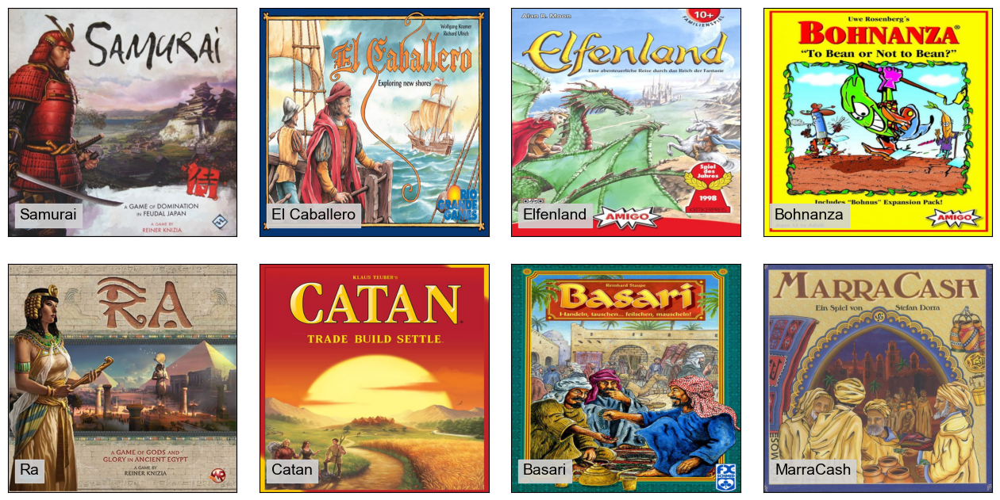

In [193]:
subplot_images(games['ImagePath'].values[:8], games['Name'].values[:8])

In [194]:
games.columns

Index(['BGGId', 'Name', 'Description', 'YearPublished', 'GameWeight',
       'AvgRating', 'BayesAvgRating', 'StdDev', 'MinPlayers', 'MaxPlayers',
       'ComAgeRec', 'LanguageEase', 'BestPlayers', 'GoodPlayers', 'NumOwned',
       'NumWant', 'NumWish', 'NumWeightVotes', 'MfgPlaytime', 'ComMinPlaytime',
       'ComMaxPlaytime', 'MfgAgeRec', 'NumUserRatings', 'NumComments',
       'NumAlternates', 'NumExpansions', 'NumImplementations',
       'IsReimplementation', 'Family', 'Kickstarted', 'ImagePath',
       'Rank:boardgame', 'Rank:strategygames', 'Rank:abstracts',
       'Rank:familygames', 'Rank:thematic', 'Rank:cgs', 'Rank:wargames',
       'Rank:partygames', 'Rank:childrensgames', 'Cat:Thematic',
       'Cat:Strategy', 'Cat:War', 'Cat:Family', 'Cat:CGS', 'Cat:Abstract',
       'Cat:Party', 'Cat:Childrens'],
      dtype='object')

In [195]:
games['MinPlayers'].value_counts().sort_index()

0        28
1      3288
2     12128
3      2241
4       421
5        56
6        22
7        14
8         8
9         2
10        1
Name: MinPlayers, dtype: int64

In [196]:
games['ComAgeRec'].value_counts().sort_index()

2.000000       24
2.045455        1
2.111111        1
2.142857        1
2.200000        2
2.250000        2
2.312500        1
2.333333        3
2.400000        1
2.500000       10
2.545455        1
2.666667        6
2.714286        2
2.750000        3
2.789474        1
2.800000        1
2.857143        2
2.863636        1
2.866667        1
2.875000        1
3.000000       92
3.033333        1
3.040000        1
3.055556        1
3.071429        1
3.100000        1
3.130435        1
3.142857        2
3.188679        1
3.200000        1
3.250000        5
3.285714        1
3.333333        8
3.375000        3
3.384615        1
3.400000        3
3.428571        1
3.471910        1
3.491525        1
3.500000       42
3.562500        1
3.571429        2
3.600000        3
3.629630        1
3.666667       16
3.702703        1
3.705882        1
3.750000        7
3.800000        6
3.833333        1
3.875000        1
3.890909        1
3.909091        1
3.914286        1
3.916667        1
3.937500  

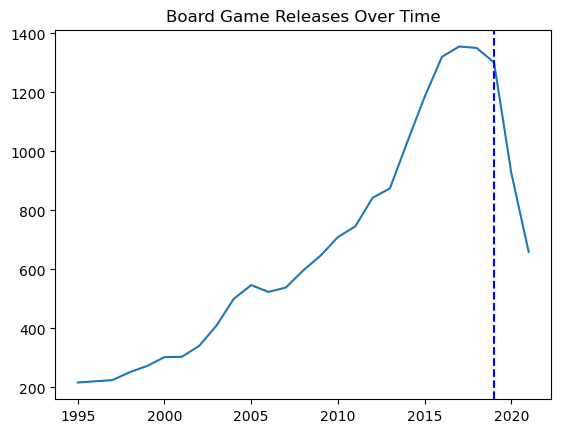

In [197]:
yr_plot = games['YearPublished'].value_counts().sort_index()
plt.plot(yr_plot.index, yr_plot.values)
plt.title('Board Game Releases Over Time')
plt.axvline(2019, ls='--', c='b')

Here we can see no of board game releases decreased during covid pandamic(2019-21)

mechanics.csv

	BGGId			BoardGameGeek game ID	
	Remaining headers are various mechanics with binary flag

themes.csv

	BGGId			BoardGameGeek game ID
	Remaining headers are various themes with binary flag

subcategories.csv

	BGGId			BoardGameGeek game ID
	Remaining headers are various subcategories with binary flag

USER_RATINGS

	BGGId			BoardGameGeek game ID	
	Rating			Raw rating given by user
	Username		User giving rating

RATINGS_DISTRIBUTION

	BGGId			BoardGameGeek game ID
	Numbers 0.0-10.0	Number of ratings per rating header
	total_ratings		Total number of ratings for game



In [198]:
# mechanics = pd.read_csv('../datasets/mechanics.csv')
# themes = pd.read_csv('../datasets/themes.csv')
# subcategories = pd.read_csv('../datasets/subcategories.csv')
# rank_dist = pd.read_csv('../datasets/ratings_distribution.csv')
user_ratings = pd.read_csv('../datasets/user_ratings.csv')

# 1.Collaborative Filtering:User-Based

In [199]:
print('unique users',user_ratings.Username.nunique())
user_ratings.head()

unique users 411374


,BGGId,Rating,Username
0,213788,8.0,Tonydorrf
1,213788,8.0,tachyon14k
2,213788,8.0,Ungotter
3,213788,8.0,brainlocki3
4,213788,8.0,PPMP


In [200]:
user_ratings.isnull().sum()


BGGId        0
Rating       0
Username    63
dtype: int64

In [201]:
user_ratings.shape

(18942215, 3)

In [202]:
user_ratings.dropna(axis=0,inplace=True)
user_ratings.shape

(18942152, 3)

### Choose user to recommend the board game


In [203]:
active_item_id='tachyon14k'
try:
    filt=(user_ratings['Username']==active_item_id)
    active_user_ratings = user_ratings[filt]
    print(active_user_ratings.shape)
    print(active_user_ratings.head())
except:
    print('no rating found:: Cold start problem')

(59, 3)
          BGGId  Rating    Username
1        213788     8.0  tachyon14k
578646   241203     8.0  tachyon14k
866582       13     5.0  tachyon14k
928573    30549     7.0  tachyon14k
1062174   36218     7.0  tachyon14k


### Select users who has rated atleast one game as the active user 

In [204]:
active_user_games = active_user_ratings['BGGId']
common_ratings = user_ratings[user_ratings['BGGId'].isin(active_user_games)]
print(f"Number of users that have at least one game in common with the active user: {common_ratings.Username.nunique()} users")

print(common_ratings.shape)
common_ratings.sample(5)

Number of users that have at least one game in common with the active user: 273043 users
(1711562, 3)


,BGGId,Rating,Username
5636216,143884,7.0,Topvi
1271342,169786,7.0,mindbomb
11800192,68448,10.0,Neolarthytep
2725190,16992,5.0,Fausticus1
10827821,155703,8.3,hamutsai


Here no of users who has rated atleast one similar game are very big so we filter those users who has rated atleast 15 common games

In [205]:
common_ratings['Username'].value_counts()

tachyon14k              59
oldgoat3769967          49
TomVasel                48
Nap16                   45
abbottj83               45
RonCarlson01            45
damonstea               44
Hessu68                 44
leffe dubbel            43
wispwalker              43
borisyankov             43
shaugville              43
zhiwiller               43
Doel                    43
cryptosha               42
fiorevita               42
Nischtewird             42
Reuner                  42
StevenBedell            42
pouletbete              42
nucleartrask            42
Hristo Filipov          41
visard                  41
thegordonshow           41
Wargriff                41
woodnoggin              41
bootty                  41
PBrennan                41
AmassGames              41
gorende                 41
vincivader              41
punkin312               41
ProZD                   41
Tolkana                 41
MaR85                   41
Dharquen                41
warta                   41
T

Here we have enough common ratings so we filter user with minimum 15 common ratings

In [206]:
min_common_items = 15
potential_neighbors = common_ratings.groupby('Username').filter(lambda grp: len(grp) >= min_common_items)
#remove active_item_id from potential_neighbors
potential_neighbors = potential_neighbors.loc[potential_neighbors.Username != active_item_id]

print(f"{potential_neighbors.Username.nunique()} users")

print(potential_neighbors.shape)
potential_neighbors.sample(5)

28137 users
(569035, 3)


,BGGId,Rating,Username
2793725,16992,5.0,Turtzi
1837974,173346,8.0,Sciurus
8092900,172225,7.5,jules1snow
8244017,199792,9.0,SammySpaceman
3311477,120677,8.5,Flangomango


![Screenshot 2024-04-05 234436.png](<attachment:Screenshot 2024-04-05 234436.png>)
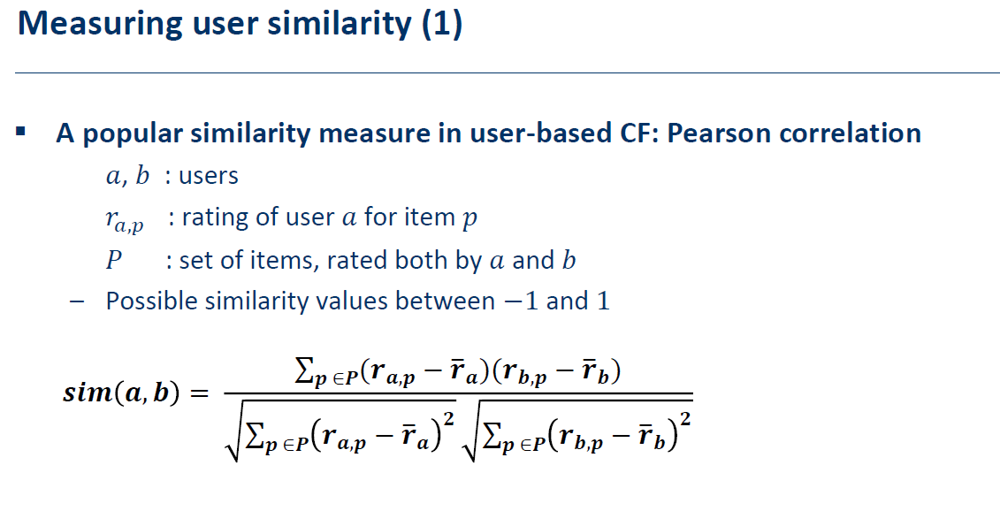

In [207]:
#take neighbor_ratings df return similarity score

def pearson_correlation(neighbor_ratings , active_user_ratings):
    negihbor_ratings_compare = neighbor_ratings.merge(active_user_ratings,on='BGGId', how='inner', suffixes=('_neighbor', '_active'))

    # Calculate the Pearson correlation
    numerator = np.sum((negihbor_ratings_compare['Rating_active'] - np.mean(negihbor_ratings_compare['Rating_active']))
                        * (negihbor_ratings_compare['Rating_neighbor'] - np.mean(negihbor_ratings_compare['Rating_neighbor'])))
    denominator = np.sqrt(np.sum((negihbor_ratings_compare['Rating_active'] - np.mean(negihbor_ratings_compare['Rating_active']))**2) 
                          * np.sum((negihbor_ratings_compare['Rating_neighbor'] - np.mean(negihbor_ratings_compare['Rating_neighbor']))**2))

    if denominator == 0:
        return 0.0  # Avoid division by zero
    else:
        return numerator / denominator  

In [208]:

similarities = potential_neighbors.groupby('Username').apply(pearson_correlation ,(active_user_ratings) )
similarities.name = 'Similarity'
similarities.shape 

(28137,)

In [209]:
similarities=similarities.sort_values(ascending=False)
print(similarities.shape)
similarities.head()

(28137,)


Username
rgtdal             0.906018
davidhouck19       0.896944
tontaub0r          0.894063
alexininikovsky    0.887463
Psycho_Inge        0.883953
Name: Similarity, dtype: float64

![Screenshot 2024-04-05 234609.png](<attachment:Screenshot 2024-04-05 234609.png>)
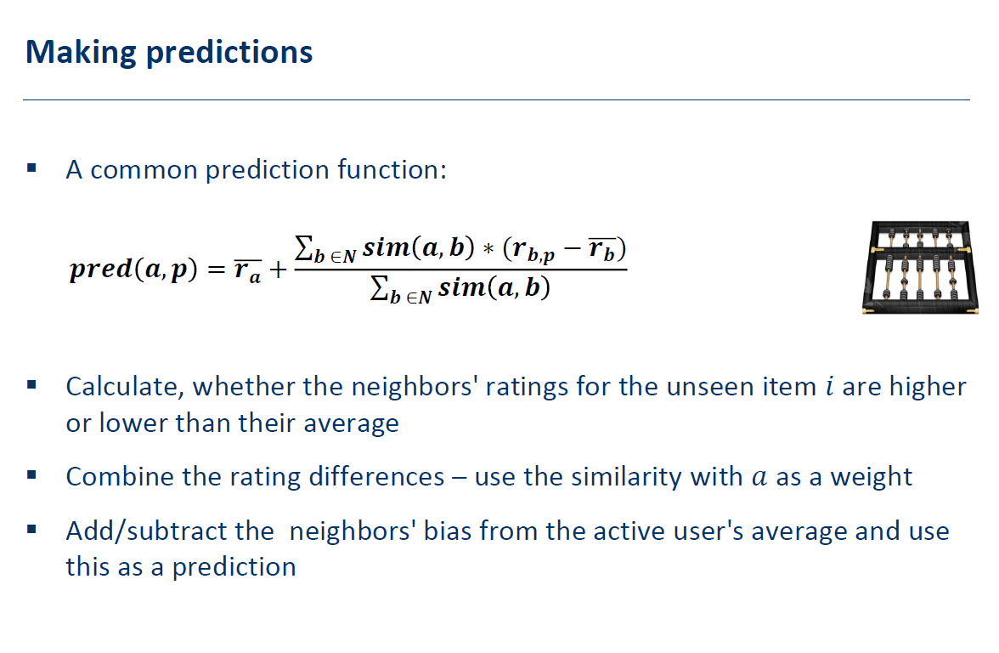

In [210]:
# relevant_neighbors=similarities[:100]
# get active user neighbors where min_similarity_score > X
min_similarity_score = 0.8
relevant_neighbors = similarities[similarities > min_similarity_score].index
print(len(relevant_neighbors))
relevant_neighbors

120


Index(['rgtdal', 'davidhouck19', 'tontaub0r', 'alexininikovsky', 'Psycho_Inge',
       'Psieck', 'NumisHunterV', 'Dansport005', 'Juanmakine', 'rivervial',
       ...
       'Randommk', 'QuietFlowsDaDon1', 'boransezgin', 'bearhugsde',
       'Noviomagus', 'Ghost_train', 'ThreeAM', 'mattwood1221', 'JDLOW',
       'Vaporub711'],
      dtype='object', name='Username', length=120)

Get games suggestion where relevant_neighbors rate the game and the active user did NOT rate the game

In [211]:
recommend_ratings = user_ratings.loc[user_ratings['Username'].isin(relevant_neighbors) &   # only games that were rated by the active user neighbors
                                   ~user_ratings['BGGId'].isin(active_user_games)]  # only games that the active user did not see

print(recommend_ratings.shape)
recommend_ratings.head()

(18076, 3)


,BGGId,Rating,Username
606,114784,5.0,Jimmy_volador
1926,113656,5.9,Lothrain
2297,157521,6.0,DJStudley
4626,192352,3.0,Vamric
5464,209280,5.0,Guttiman


Calculate game rating weighted avg (with similarity)

In [212]:
def game_pred_score(game_ratings , similarities):
    game_ratings = game_ratings.join(similarities, on='Username')
    
    r_a=np.mean(active_user_ratings['Rating'])

    return r_a + ((game_ratings['Rating'] -np.mean(game_ratings['Rating']))* game_ratings['Similarity']).sum() / game_ratings['Similarity'].sum()

In [213]:
# apply game_pred_score on recommend_ratings
game_scores = recommend_ratings.groupby('BGGId').apply(game_pred_score ,(similarities) )
game_scores.name = 'Score'
game_scores.sort_values(ascending=False).head()

BGGId
145609    6.997967
73171     6.970203
9364      6.967717
176165    6.963029
40270     6.962397
Name: Score, dtype: float64

Select top 10 games suggestion by game score (rating weighted avg)

In [214]:
n_recommendations = 10
final_recommendation = game_scores.sort_values(ascending=False)[:n_recommendations]
final_recommendation= final_recommendation.to_frame('score').reset_index()
final_recommendation

,BGGId,score
0,145609,6.997967
1,73171,6.970203
2,9364,6.967717
3,176165,6.963029
4,40270,6.962397
5,124548,6.962397
6,108722,6.955131
7,4154,6.953404
8,158275,6.948931
9,111173,6.948704


Get details of final recommended games

In [215]:
filt=games['BGGId'].isin(final_recommendation['BGGId'])
recommend=games.loc[filt]

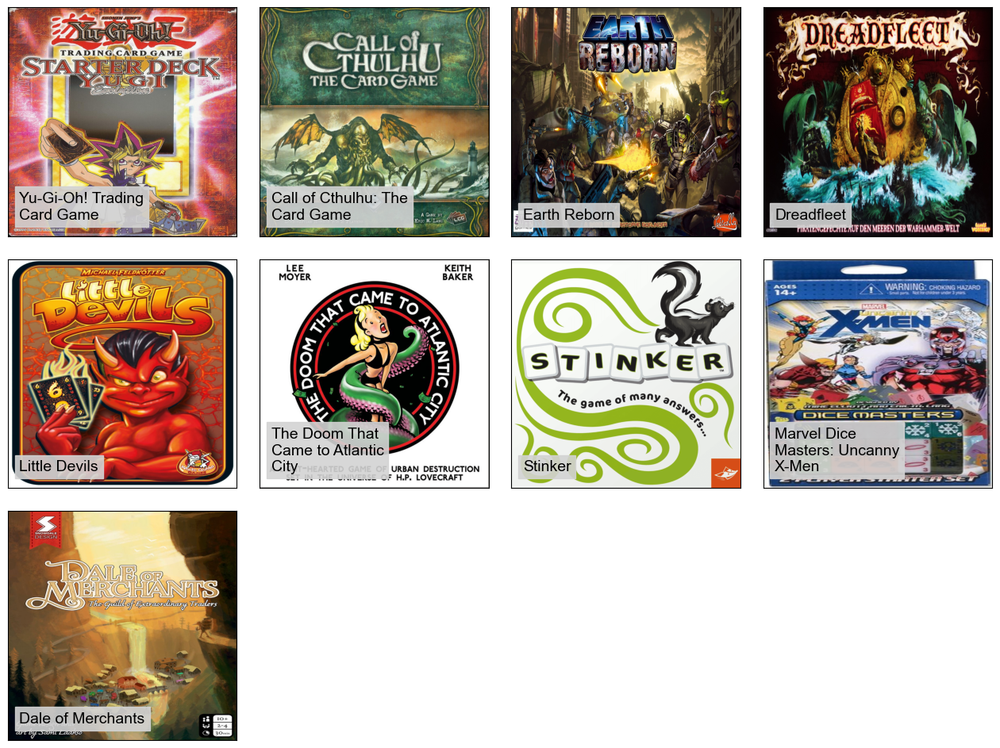

In [216]:
subplot_images(recommend['ImagePath'].values[:], recommend['Name'].values[:])

In [217]:
#merge top 5 games suggestion with game details
top_picks= final_recommendation.merge( games[['BGGId','Name','Description']] , on='BGGId', how='left')
top_picks.dropna(axis=0,inplace=True)
top_picks

,BGGId,score,Name,Description
0,145609,6.997967,Stinker,stinker aka bananagram humanity accord dirty playtester inevitably dirty card humanity word game...
1,73171,6.970203,Earth Reborn,year faction emerge underground city new world earth reborn nuclear disaster highly detailed m...
3,176165,6.963029,Dale of Merchants,age great discovery new wonderful item find way hand great merchant place trader love town dalet...
4,40270,6.962397,Call of Cthulhu: The Card Game,quotthe old strong emotion mankind fear old strong kind fear fear unknownuml hp lovecraft supern...
5,124548,6.962397,The Doom That Came to Atlantic City,game description publisheryoure great old one ndash being ancient eldritch power cosmic force ho...
6,108722,6.955131,Dreadfleet,game description publisherfor bleak decade undead reaver count noctilus plague ocean world raid ...
7,4154,6.953404,Yu-Gi-Oh! Trading Card Game,yugioh trading card game collectible card game base hit tv series collectible card game play d...
8,158275,6.948931,Marvel Dice Masters: Uncanny X-Men,marvel dice master uncanny xmen collectible dicebuilde tabletop game design quarrior creators mi...
9,111173,6.948704,Little Devils,everybody fond teasing challenge time time game try saddle oppose player negative card little de...


# Collaborative Filtering:Item-Based

In [218]:
user_ratings.head()

,BGGId,Rating,Username
0,213788,8.0,Tonydorrf
1,213788,8.0,tachyon14k
2,213788,8.0,Ungotter
3,213788,8.0,brainlocki3
4,213788,8.0,PPMP


In [219]:
import regex as re
games_df=games
for i in range(games_df.shape[0]):
    games_df.iloc[i,1]=re.sub(r'[ ]', '',str(games_df.iloc[i,1]))
games_df.sample(10)

,BGGId,Name,Description,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,ComAgeRec,LanguageEase,BestPlayers,GoodPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumImplementations,IsReimplementation,Family,Kickstarted,ImagePath,Rank:boardgame,Rank:strategygames,Rank:abstracts,Rank:familygames,Rank:thematic,Rank:cgs,Rank:wargames,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
4142,7679,Busine$$GO,rule quotwant test money make instinct cutthroat world finance international money game ultimate...,1996,2.0000,6.17200,5.50347,1.63929,2,5,NaN,23.000000,0,[],51,0,2,3,60,60,60,12,30,0,1,0,0,0,NaN,0,https://cf.geekdo-images.com/eDrCRCpx_4nKiOzfP0Rb1g__original/img/ZpG590WpzWnSJNC74s1Ww5f2bAw=/0...,17363,21926,21926,21926,21926,21926,21926,21926,21926,0,0,0,0,0,0,0,0
20662,290462,BananaBandido,banana bandido monkey wild west try prevail monkey manipulation deceptive alliance determine ram...,2019,1.6667,5.85936,5.50676,1.27368,2,5,8.000000,NaN,0,[],79,0,6,3,30,15,30,9,45,0,0,0,0,0,NaN,0,https://cf.geekdo-images.com/_PnpbC23AvifR3ZIXWoqDQ__original/img/wzOcA_OI1GUty0pLM4KsxZYibcs=/0...,16837,21926,21926,21926,21926,21926,21926,21926,21926,0,0,0,0,0,0,0,0
17224,222509,LordsofHellas,enter dark age greece rule mighty god wield advanced technology control asymmetric hero choose p...,2018,3.3349,7.79546,7.19627,1.47253,1,4,12.045455,3.400000,4,"['3', '4']",10048,383,2383,209,90,60,90,14,6084,0,1,9,1,0,Lords of Hellas,1,https://cf.geekdo-images.com/iOqSO4vRZFp4MqEKXDXEIw__original/img/j6ZIl2_7596G_45A5wKAHRWiga4=/0...,248,170,21926,21926,21926,21926,21926,21926,21926,0,1,0,0,0,0,0,0
12753,147009,ZombieKidz,zombie move cemetery close home unfortunately parent believe friend decide matter handsin cooper...,2013,1.1111,6.00913,5.53941,1.53022,2,4,4.400000,11.000000,0,[],438,3,44,9,15,15,15,7,184,0,1,1,2,0,NaN,0,https://cf.geekdo-images.com/OgeD1duaaYAHo1iYT9BmPQ__original/img/kl0Fmoq8ODhel2uzKvy415qXoiM=/0...,11538,21926,21926,21926,21926,21926,21926,21926,247,0,0,0,0,0,0,0,1
8653,38062,Privacy2,privacy sequel privacy new question bring new incredible truth friend wo nt believe ear,2008,1.2727,6.41694,5.58295,1.57719,5,12,17.000000,14.333333,0,[],352,0,11,11,45,45,45,16,183,0,0,1,0,0,Privacy,0,https://cf.geekdo-images.com/Xf-zsYcHP2C8yiPlpTyZJA__original/img/P_nejQgcexrab7O-LpiX-Y3sJ5s=/0...,8182,21926,21926,21926,21926,21926,21926,21926,21926,0,0,0,0,0,0,0,0
18785,251632,BeeLives:WeWillOnlyKnowSummer,bee live know summer game design run player year manage wild bee hive player mediumweight euro...,2019,3.6000,6.83189,5.58350,1.59425,1,4,14.000000,332.000000,0,[],371,36,166,10,120,30,120,14,135,0,0,0,0,0,NaN,0,https://cf.geekdo-images.com/IbNSl5CgsCd-57pRycqYbw__original/img/Rhz_-ZDXgrKfjdw_2m43yfPVcRg=/0...,8151,21926,21926,21926,21926,21926,21926,21926,21926,0,0,0,0,0,0,0,0
3797,6702,Battlecards:WorldConflict–TheRussianFront–StarterSet,russian frontthe soviet union vs germanyfrustrate stalemate west hitler turn fierce ambition eas...,2003,2.2000,5.38088,5.49390,1.83756,2,8,NaN,NaN,0,[],125,3,3,5,60,60,60,10,68,0,0,0,0,0,Battlecards (DG Associates),0,https://cf.geekdo-images.com/CmADD6NvcMOgasYXAhlUHA__original/img/ezYnIm8GGFl0m-4Iwaplx94WLrE=/0...,18704,21926,21926,21926,21926,21926,3403,21926,21926,0,0,1,0,0,0,0,0
7008,22479,HorrorClix,player assemble team monster horror spectrum mdash include vampire zombie werewolf mdash protect...,2006,2.3061,6.46841,5.64534,1.60598,2,0,10.666667,308.200000,0,[],774,22,48,49,60,60,60,12,403,0,1,1,0,0,NaN,0,https://cf.geekdo-images.com/5Zam4CWg6MmcB5d12P_TSQ__original/img/pqM9rAFdNv38rVPIMSvWgWkdsiY=/0...,6025,21926,21926,21926,21926,127,21926,21926,21926,0,0,0,0,1,0,0,0
15249,184900,Ophiuchus:TheThirteenthConstellation,ophiuchus compose title card card represent constellationsplayer turn place car

In [220]:
game_name='Nemesis'
game_name=re.sub(r'[ ]', '',str(game_name))
active_item_id=games_df.loc[games_df['Name']==game_name,'BGGId']
active_item_id=np.array(active_item_id)[0]
active_item_id

167355

In [221]:
user_ratings.head()

,BGGId,Rating,Username
0,213788,8.0,Tonydorrf
1,213788,8.0,tachyon14k
2,213788,8.0,Ungotter
3,213788,8.0,brainlocki3
4,213788,8.0,PPMP


In [222]:
try:
    filt=(user_ratings['BGGId']==active_item_id)
    active_item_ratings = user_ratings[filt]
    print(active_item_ratings.shape)
    print(active_item_ratings.head())
except:
    print("No rating found::Cold Start Problem")

(17110, 3)
          BGGId  Rating       Username
3574134  167355     5.5          GLACY
3574135  167355     5.5        prd1982
3574136  167355     5.5   boydetective
3574137  167355     5.5  Hiroyuki Ueno
3574138  167355     5.5         Hruler


In [223]:
common_ratings = user_ratings[user_ratings['Username'].isin(active_item_ratings['Username'])]
common_ratings.head()

,BGGId,Rating,Username
6,213788,8.0,BioNighty
7,213788,8.0,htwongah
18,213788,7.5,dontylw
21,213788,7.5,m1hune2007
26,213788,7.0,projectmoonlightcafe


In [224]:
common_ratings['BGGId'].value_counts()

167355    17110
167791    10040
169786     9369
30549      8125
266192     7649
173346     7537
174430     7502
68448      7405
230802     7372
170216     7186
178900     7179
822        6992
13         6395
237182     6380
162886     6144
205059     6114
205637     5741
148228     5721
121921     5661
150376     5659
36218      5638
199792     5597
161936     5569
201808     5517
224517     5448
193738     5423
187645     5413
70323      5389
40692      5334
163412     5333
183394     5195
84876      5189
14996      5078
31260      4971
129622     4968
110327     4968
146021     4834
3076       4813
244521     4797
9209       4795
120677     4785
39856      4751
2651       4563
284083     4556
205896     4512
12333      4499
147020     4429
28143      4340
182028     4298
124361     4267
126163     4260
146508     4167
181304     4158
37111      4131
34635      4130
194655     4114
199561     4105
96848      4100
204583     4099
180263     4078
103343     4045
236457     4038
157354  

In [225]:
min_common_items = 20
potential_neighbors = common_ratings.groupby('BGGId').filter(lambda grp: len(grp) >= min_common_items)
#remove active_item_id from potential_neighbors
potential_neighbors = potential_neighbors.loc[potential_neighbors.BGGId != active_item_id]
potential_neighbors.head()


,BGGId,Rating,Username
6,213788,8.0,BioNighty
7,213788,8.0,htwongah
18,213788,7.5,dontylw
21,213788,7.5,m1hune2007
26,213788,7.0,projectmoonlightcafe


In [226]:
from scipy.spatial import distance
def cos_similarity(neighbor_ratings , active_item_ratings):
    negihbor_ratings_compare = neighbor_ratings.merge(active_item_ratings,
         on='Username', how='inner', suffixes=('_neighbor', '_active'))
    
    cos_distance = distance.cosine(negihbor_ratings_compare['Rating_active'],
                                   negihbor_ratings_compare['Rating_neighbor'])
    return 1 - cos_distance

In [227]:
similarities = potential_neighbors.groupby('BGGId').apply(cos_similarity ,(active_item_ratings) )
similarities.name = 'Similarity'

In [228]:
similarities=similarities.sort_values(ascending=False)
similarities

BGGId
205164    0.995828
310100    0.995303
183315    0.994703
177014    0.994486
324639    0.994131
307621    0.994020
295785    0.994010
333280    0.993984
259586    0.993979
299566    0.993811
208700    0.993803
249277    0.993775
295949    0.993691
124356    0.993676
257349    0.993323
242227    0.993215
322339    0.993107
305752    0.993035
346501    0.992961
318009    0.992928
235362    0.992840
284121    0.992830
309207    0.992753
326112    0.992721
207951    0.992681
322696    0.992474
277659    0.992413
286344    0.992409
319375    0.992311
297658    0.992235
286343    0.992096
250481    0.992014
333144    0.992013
291847    0.992005
292375    0.991875
249421    0.991869
265113    0.991683
291794    0.991660
276633    0.991636
275044    0.991601
251723    0.991499
251433    0.991495
284294    0.991371
323612    0.991368
327076    0.991357
299684    0.991314
321720    0.991306
333553    0.991288
287116    0.991243
299179    0.991225
339789    0.991204
299569    0.991163
333055

![Screenshot 2024-04-06 174411.png](<attachment:Screenshot 2024-04-06 174411.png>)
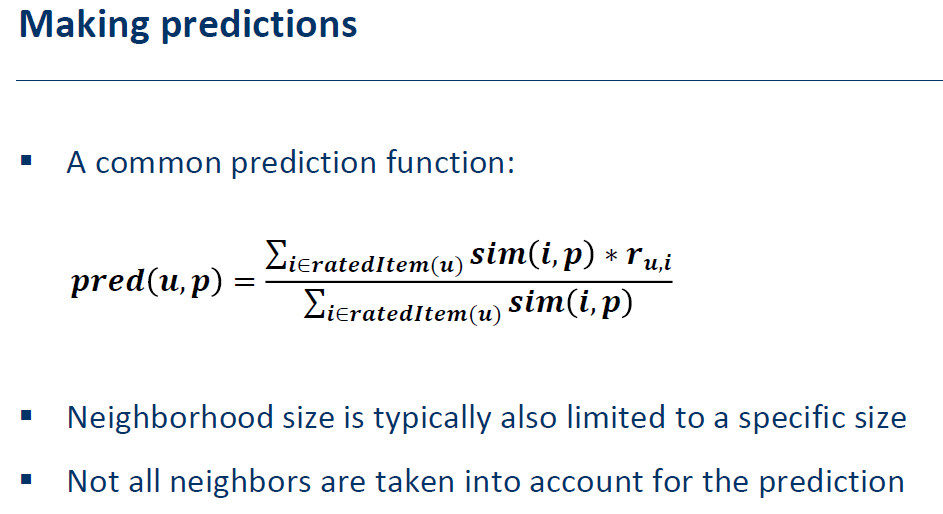

In [229]:
min_similarity_score = 0.8
relevant_neighbors = similarities[similarities > min_similarity_score].index
relevant_neighbors

Int64Index([205164, 310100, 183315, 177014, 324639, 307621, 295785, 333280,
            259586, 299566,
            ...
            232895,   3522,  31145, 137336,   7316,   7972, 206274,  15549,
             11901,  16398],
           dtype='int64', name='BGGId', length=9326)

In [230]:
recommend_ratings=user_ratings.loc[user_ratings['BGGId'].isin(relevant_neighbors)]
recommend_ratings.head()

,BGGId,Rating,Username
0,213788,8.0,Tonydorrf
1,213788,8.0,tachyon14k
2,213788,8.0,Ungotter
3,213788,8.0,brainlocki3
4,213788,8.0,PPMP


In [231]:
def game_pred_score(game_ratings,similarities):
    game_ratings = game_ratings.join(similarities, on='BGGId')
    return (game_ratings['Rating'] * game_ratings['Similarity']).sum() /game_ratings['Similarity'].sum()
game_scores = recommend_ratings.groupby('BGGId').apply(game_pred_score ,(similarities) )
game_scores.name = 'Score'
game_scores.head()

BGGId
1    7.672014
2    6.642697
3    7.484580
4    6.599476
5    7.439818
Name: Score, dtype: float64

In [232]:
#select top 10 games suggestion by game score (rating weighted avg)
n_recommendations = 10
final_recommendation = game_scores.sort_values(ascending=False)[:n_recommendations]
final_recommendation= final_recommendation.to_frame('score').reset_index()
final_recommendation

,BGGId,score
0,284121,9.732200
1,295785,9.637741
2,342942,9.633957
3,249277,9.530000
4,341169,9.351379
5,323947,9.215829
6,277659,9.201183
7,299659,9.118644
8,329082,9.095452
9,278292,9.072680


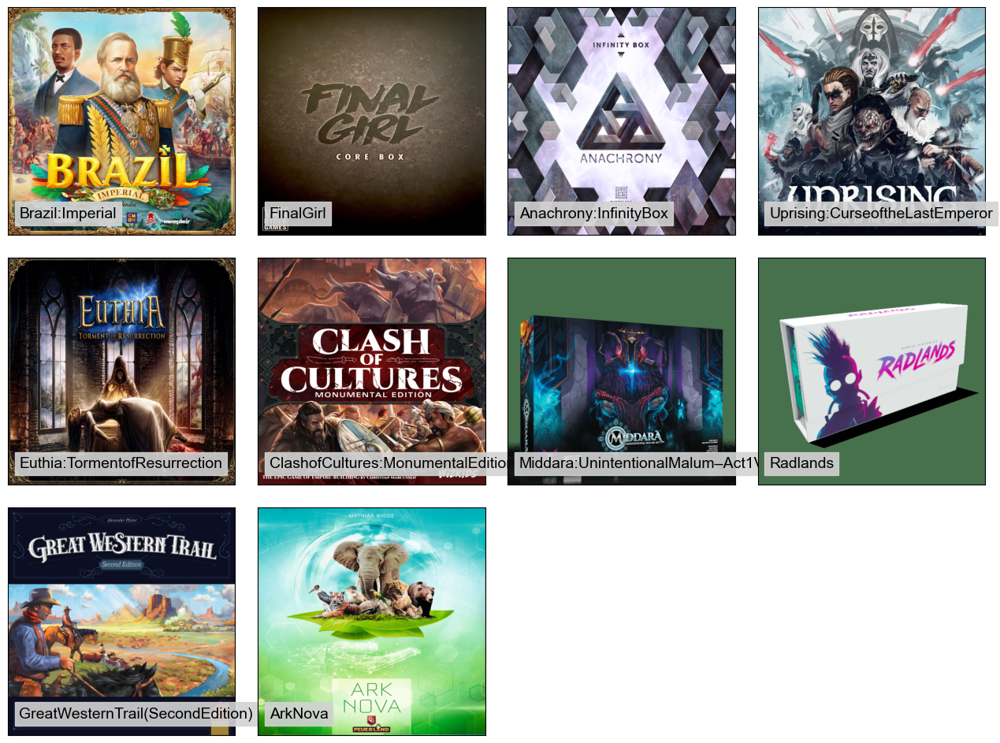

In [233]:
filt=games['BGGId'].isin(final_recommendation['BGGId'])
recommend=games.loc[filt]
subplot_images(recommend['ImagePath'].values[:], recommend['Name'].values[:])

In [234]:
#merge top 5 games suggestion with game details
top_picks= final_recommendation.merge( games[['BGGId','Name','Description']] , on='BGGId', how='left')
top_picks.dropna(axis=0,inplace=True)
top_picks

,BGGId,score,Name,Description
0,284121,9.732200,Uprising:CurseoftheLastEmperor,uprising curse emperor strategically challenging fully cooperative board game player set dee...
1,295785,9.637741,Euthia:TormentofResurrection,face threat mighty dragon bear darkness magic faer deal monster dangerous creature plague land s...
2,342942,9.633957,ArkNova,ark nova plan design modern scientifically manage zoo ultimate goal own successful zoological es...
3,249277,9.530000,Brazil:Imperial,role great monarchs past valor arrive vast rich territory road prosperity fill challengesin braz...
4,341169,9.351379,GreatWesternTrail(SecondEdition),america th century rancher repeatedly herd cattle texas kansas city send train earn money victor...
5,323947,9.215829,Middara:UnintentionalMalum–Act1Version1.1,middara player cooperative chooseyourownadventure style miniatures board game player assume ro...
6,277659,9.201183,FinalGirl,final girl core boxplaye famous horror movie trope final girl solitaireonly game put player shoe...
7,299659,9.118644,ClashofCultures:MonumentalEdition,clash culture monumental edition bring classic game exploration expansion development clash cult...
8,329082,9.095452,Radlands,radland competitive duel card game identify fiercely powerful card synergiesact leader post apoc...
9,278292,9.072680,Anachrony:InfinityBox,anachrony worker placement tableau building game set foreboding future leader humanitys ideologi...


2. Content-based Recommendation
3. Knowledge-based Recommendation